<h4 align="center">Jian Sun</h4>
<h4 align="center">DUID: 873397832</h4>

# CONTENT
- Introduction
- Data Exploration
- Model
- Conclusion
- Appendix

# Introduction
This project is to use image mosaicing or stitching technique to create a panoramic view of a scene. There are two alternative methods. To implement two methods, we use Matlab to code both two alternative methods and use Python to code alternative 2. Then, we will compare the result of both methods gotten from Matlab, and compare the result of alternative two method from Python and Matlab. Based one comprehensive analysis, we try to draw an objective conclusion.

# Data Exploration
The dataset is three images of DU campus scene. The size of each image is:

|Name     |Row   |Column |Layer  
|:--------|:----:|:-----:|:-----:
|mcr.jpg  |1440  |1440   |3      
|mcc.jpg  |1440  |1440   |3    
|mcl.jpg  |1440  |1440   |3           




# Model
To create panoramic view, the following techniques are great helpful.
## Theory
### Harris Corner Detector
Harris Corner Detector is a corner detection operator that is commonly used in computer vision algorithms to extract corners and infer features of an image. It takes the differential of the corner score into account with reference to direction directly, instead of using shifting patches for every 45 degree angles, and has been proved to be more accurate in distinguishing between edges and corners. Click [here](https://docs.opencv.org/3.4.1/dc/d0d/tutorial_py_features_harris.html) and [here](https://en.wikipedia.org/wiki/Harris_Corner_Detector) for more details.
### Scale Invariant Feature Transform (SIFT)
SIFT is constructed out of image gradients, and uses both magnitude and orientation. The descriptor is normalized to suppress the effects of change in illumination intensity. The descriptor is a set of histograms of image gradients that are then normalized. These histograms expose general spatial trends in the image gradients in the patch but suppress detail. Click [here](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_sift_intro/py_sift_intro.html) for more details.
### Random Sample Consensus (RANSAC)
An alternative to modifying the cost function is to search the collection of data points for good points. This is quite easily done by an iterative process: First, we choose a small subset of points and fit to that subset, and then we see how many other points fit to the resulting object. We continue this process until we have a high probability of finding the structure we are looking for. Click [here](https://en.wikipedia.org/wiki/Random_sample_consensus) for more details.
### Backward Projection
Back Projection is a way of recording how well the pixels of a given image fit the distribution of pixels in a histogram model. To make it simpler: For Back Projection, you calculate the histogram model of a feature and then use it to find this feature in an image.  
Usually, affine transformation is projected from target image to destinate image. To elevate the accuracy and reduce the difficulty, we use backward projection, select a region from destinate image and calculate inverse homography to make the corresponding region on target image. Click [here](https://docs.opencv.org/2.4/doc/tutorials/imgproc/histograms/back_projection/back_projection.html) for more details.


## Alternative One
We use vl_feat package in Matlab to implement this method. This method has the following steps,  
- Extract corner points by Harris corner detector. vl_covdet( ) helps
- Describe the key points by SIFT feature descriptor. vl_covdet( ) helps
- Find the best matches for key points. vl_ubcmatch( ) helps
- Find inliers and estimate the parameters of the Projective transformation by RANSAC. ransacfithomography( ) helps
- Use backward projection to warp the second image. vl_imwbackward( ) helps
- Blend the first image with the warped one.

## Alternative Two
We use both vl_feat in Matlab and Opencv in Python to implement this method. This method has the following steps,
- Extract key points and their descriptor by SIFT. Matlab: vl_sift( ); Python: cv2.xfeatures2d.SIFT_create(), sift.detectAndCompute( )
- Get good matching. Matlab: vl_ubcmatch(,,threshold); Python: cv2.BFMatcher(), bf_rc.knnMatch( ), ratio test
- Find inliers and the parameters of the Projective transformation by RANSAC. Matlab: ransacfithomography( ); Python: cv2.findHomography( )
- Use backward projection to warp the second image. Matlab: vl_imwbackward( ); Python: cv2.warpPerspective( )
- Blend the first image with the warped one.

## Code Structure
### Alternative One
In Matlab, we put Harris Corner Detector, SIFT, Best Matches, RANSAC, Backward Projection, Warping and Blending in function concat_a1( ). Function ransacfithomography( ) is for RANSAC. Finally we call concat_a1( ) in main1.m and main2.m to finish image mosaicing.
### Alternative Two
In Matlab, we put SIFT, Best Matches, RANSAC, Backward Projection, Warping and Blending in function concat_a2( ). Function ransacfithomography( ) is for RANSAC. Finally we call concat_a2( ) in main1.m and main2.m to finish image mosaicing.  
In Python, we call existing Opencv functions to create panoramic view.

# Conclusion
## Matlab
### Key Points and Descriptors

(Text(0.5, 1.0, 'Alter 2'),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

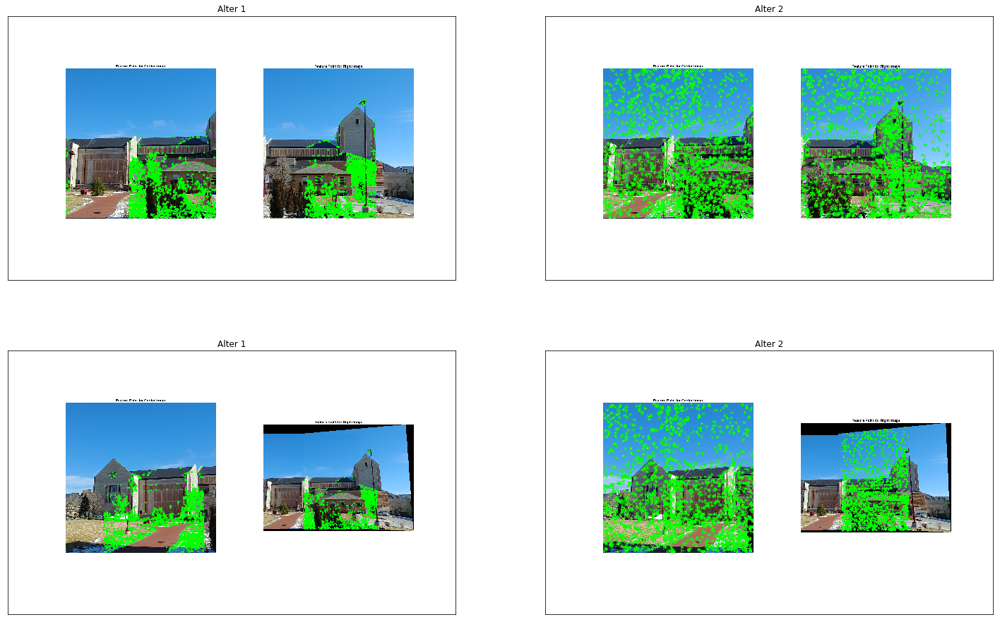

In [14]:
kp_rc_a1 = cv2.imread('./Img/Ma_Img/kp_des_rc_a1.png')
kp_rc_a2 = cv2.imread('./Img/Ma_Img/kp_des_rc_a2.png')
kp_cl_a1 = cv2.imread('./Img/Ma_Img/kp_des_cl_a1.png')
kp_cl_a2 = cv2.imread('./Img/Ma_Img/kp_des_cl_a2.png')
## show image
plt.figure(figsize=(25,16))
plt.subplot(221),plt.imshow(BGR2RGB(kp_rc_a1))
plt.title('Alter 1'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(BGR2RGB(kp_rc_a2))
plt.title('Alter 2'), plt.xticks([]), plt.yticks([])
plt.subplot(223),plt.imshow(BGR2RGB(kp_cl_a1))
plt.title('Alter 1'), plt.xticks([]), plt.yticks([])
plt.subplot(224),plt.imshow(BGR2RGB(kp_cl_a2))
plt.title('Alter 2'), plt.xticks([]), plt.yticks([])


### Feature Matching

(Text(0.5, 1.0, 'Alter 2'),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

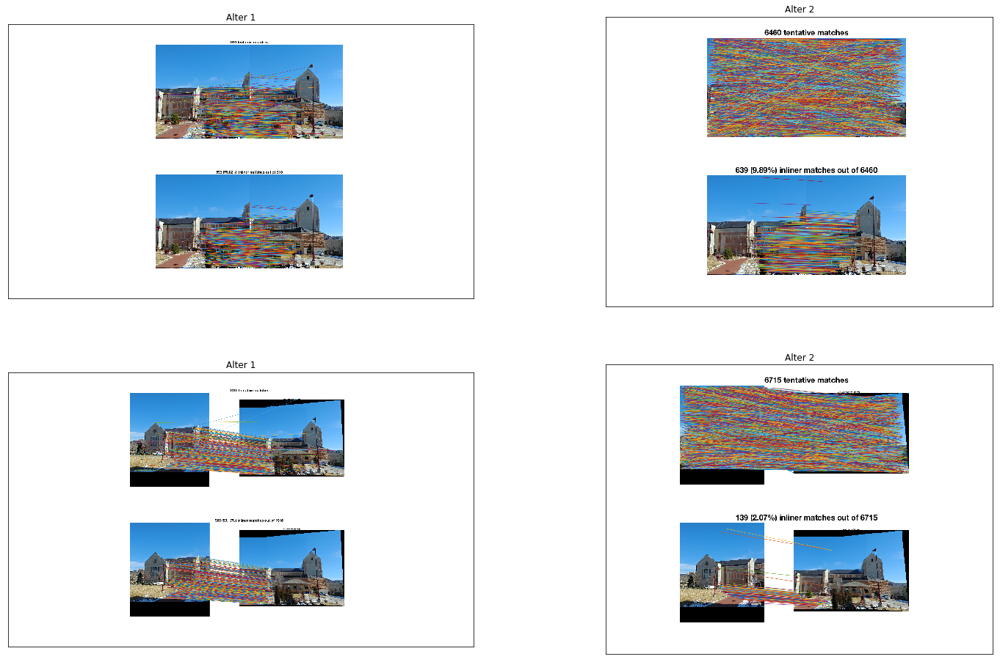

In [15]:
mat_rc_a1 = cv2.imread('./Img/Ma_Img/best_mat_rc_a1.png')
mat_rc_a2 = cv2.imread('./Img/Ma_Img/best_mat_rc_a2.png')
mat_cl_a1 = cv2.imread('./Img/Ma_Img/best_mat_cl_a1.png')
mat_cl_a2 = cv2.imread('./Img/Ma_Img/best_mat_cl_a2.png')
## show image
plt.figure(figsize=(25,16))
plt.subplot(221),plt.imshow(BGR2RGB(mat_rc_a1))
plt.title('Alter 1'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(BGR2RGB(mat_rc_a2))
plt.title('Alter 2'), plt.xticks([]), plt.yticks([])
plt.subplot(223),plt.imshow(BGR2RGB(mat_cl_a1))
plt.title('Alter 1'), plt.xticks([]), plt.yticks([])
plt.subplot(224),plt.imshow(BGR2RGB(mat_cl_a2))
plt.title('Alter 2'), plt.xticks([]), plt.yticks([])


### Panoramic View

(Text(0.5, 1.0, 'Alter 2_Full View'),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

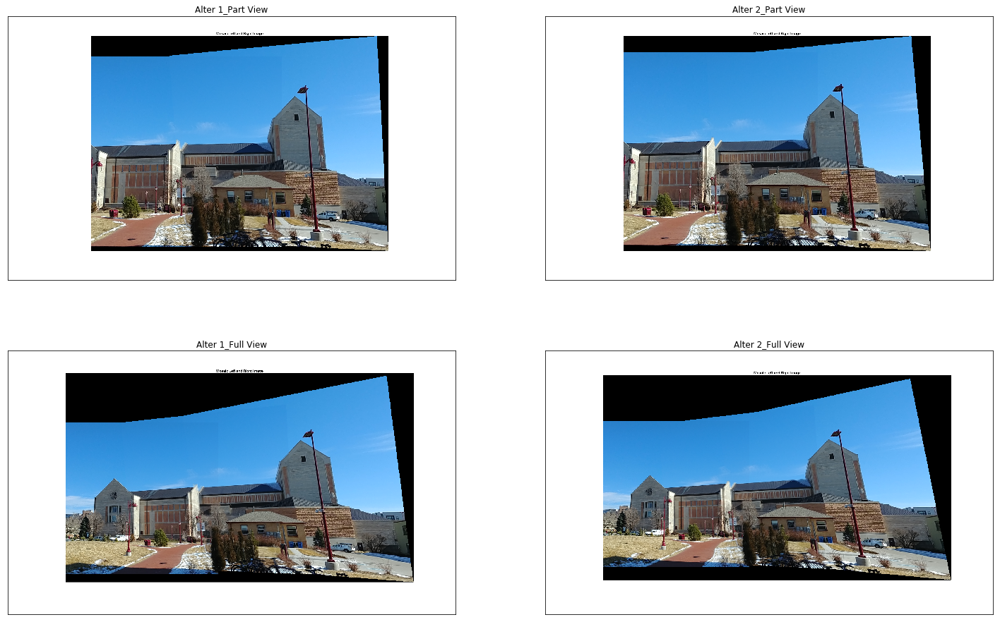

In [16]:
pv_rc_a1 = cv2.imread('./Img/Ma_Img/mosaic_rc_a1.png')
pv_rc_a2 = cv2.imread('./Img/Ma_Img/mosaic_rc_a2.png')
pv_cl_a1 = cv2.imread('./Img/Ma_Img/mosaic_cl_a1.png')
pv_cl_a2 = cv2.imread('./Img/Ma_Img/mosaic_cl_a2.png')
## show image
plt.figure(figsize=(25,16))
plt.subplot(221),plt.imshow(BGR2RGB(pv_rc_a1))
plt.title('Alter 1_Part View'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(BGR2RGB(pv_rc_a2))
plt.title('Alter 2_Part View'), plt.xticks([]), plt.yticks([])
plt.subplot(223),plt.imshow(BGR2RGB(pv_cl_a1))
plt.title('Alter 1_Full View'), plt.xticks([]), plt.yticks([])
plt.subplot(224),plt.imshow(BGR2RGB(pv_cl_a2))
plt.title('Alter 2_Full View'), plt.xticks([]), plt.yticks([])

As we can see, alternative one only detects corner. In a meanwhile, alternative two even extract feature from flat area, which will be bias for feature matching. This is obvious from the feature matching plots. The match line in alter 2 looks very messy and isn't reasonable. The percentage of best matching line is low. Conversely, match line in alter performs perfect. However, according to the final panoramic view, the alter 2 brings us more nature mosaicing image. The alter 1 shows a little bit blurred.  
Hence, if we only consider the result, the alternative two wins the alternative one in Matlab. If we consider the inliers, feature matching, the alternative one wins the alternative two in Matlab.

## Python
### Key Points and Descriptors

(Text(0.5, 1.0, 'Feature Point_Left'),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

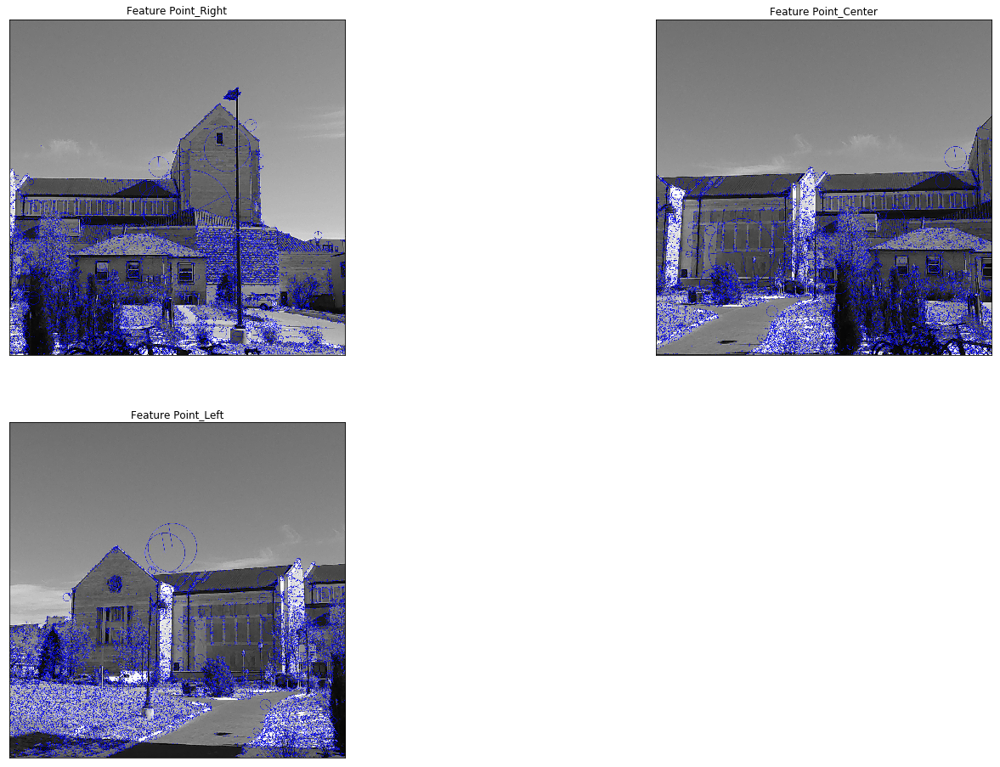

In [20]:
kp_r = cv2.imread('./Img/Py_Img/kp_py_r.jpg')
kp_c = cv2.imread('./Img/Py_Img/kp_py_c.jpg')
kp_l = cv2.imread('./Img/Py_Img/kp_py_l.jpg')
kp_rc = cv2.imread('./Img/Py_Img/kp_py_rc.jpg')
## show image
plt.figure(figsize=(25,16))
plt.subplot(221),plt.imshow(BGR2RGB(kp_r))
plt.title('Feature Point_Right'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(BGR2RGB(kp_c))
plt.title('Feature Point_Center'), plt.xticks([]), plt.yticks([])
plt.subplot(223),plt.imshow(BGR2RGB(kp_l))
#plt.title('Feature Point_Part View'), plt.xticks([]), plt.yticks([])
#plt.subplot(224),plt.imshow(kp_rc)
plt.title('Feature Point_Left'), plt.xticks([]), plt.yticks([])

### Feature Matching

(Text(0.5, 1.0, 'Feature Point_Center'),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

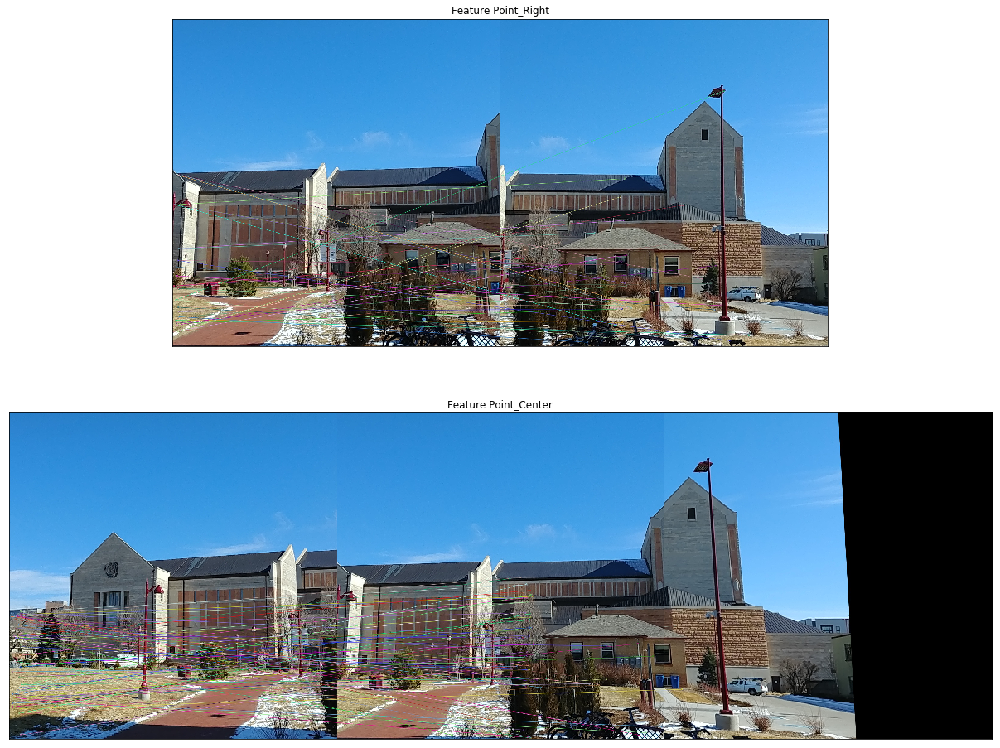

In [21]:
mat_rc = cv2.imread('./Img/Py_Img/mat_py_rc.jpg')
mat_cl = cv2.imread('./Img/Py_Img/mat_py_cl.jpg')

## show image
plt.figure(figsize=(25,16))
plt.subplot(211),plt.imshow(BGR2RGB(mat_rc))
plt.title('Feature Point_Right'), plt.xticks([]), plt.yticks([])
plt.subplot(212),plt.imshow(BGR2RGB(mat_cl))
plt.title('Feature Point_Center'), plt.xticks([]), plt.yticks([])

### Panoramic VIew

(Text(0.5, 1.0, 'Full Panoramic View'),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

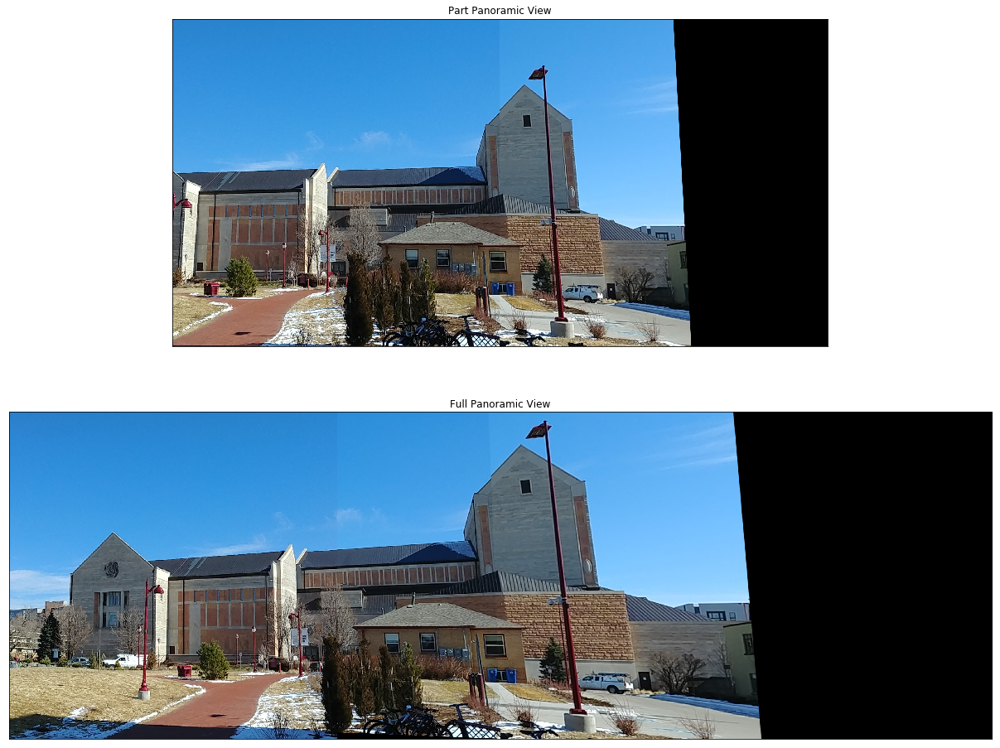

In [22]:
pv_rc = cv2.imread('./Img/Py_Img/fuse_py_rc.jpg')
pv_cl = cv2.imread('./Img/Py_Img/fuse_py_cl.jpg')

## show image
plt.figure(figsize=(25,16))
plt.subplot(211),plt.imshow(BGR2RGB(pv_rc))
plt.title('Part Panoramic View'), plt.xticks([]), plt.yticks([])
plt.subplot(212),plt.imshow(BGR2RGB(pv_cl))
plt.title('Full Panoramic View'), plt.xticks([]), plt.yticks([])

Compared with the result from Alternative 2 in Matlab, Opencv performs better on detecting key points. We don't use Harris Corner Detector here, but the Opencv automatically ignore the flat area. Conversely, vl_feat detects too much. Then, vl_feat performs better on feature matching, it is more reasonable. Opencv detects worse here. Finally, vl_feat draw better and more accurate panoramic view than Opencv. Otherwise, the Opencv's panoramic view looks more nature and more comfortable. This error can be fixed by exchanging imagesc( ) function to imshow( ).  
Generally speaking, vl_feat wins Opencv on Alternative Two method.

# Appendix

## Matlab
## ransacfithomography.m -- Fit 2D Homography Using RANSAC

In [ ]:
function [H, inliers] = ransacfithomography(x1, x2, t)

    if ~all(size(x1)==size(x2))
        error('Data sets x1 and x2 must have the same dimension');
    end
    
    [rows,npts] = size(x1);
    if rows~=2 & rows~=3
        error('x1 and x2 must have 2 or 3 rows');
    end
    
    if npts < 4
        error('Must have at least 4 points to fit homography');
    end
    
    if rows == 2    % Pad data with homogeneous scale factor of 1
        x1 = [x1; ones(1,npts)];
        x2 = [x2; ones(1,npts)];        
    end
        
    % Normalise each set of points so that the origin is at centroid and
    % mean distance from origin is sqrt(2).  normalise2dpts also ensures the
    % scale parameter is 1.  Note that 'homography2d' will also call
    % 'normalise2dpts' but the code in 'ransac' that calls the distance
    % function will not - so it is best that we normalise beforehand.
    [x1, T1] = normalise2dpts(x1);
    [x2, T2] = normalise2dpts(x2);
    
    s = 4;  % Minimum No of points needed to fit a homography.
    
    fittingfn = @homography2d;
    distfn    = @homogdist2d;
    degenfn   = @isdegenerate;
    % x1 and x2 are 'stacked' to create a 6xN array for ransac
    [H, inliers] = ransac([x1; x2], fittingfn, distfn, degenfn, s, t);
    
    % Now do a final least squares fit on the data points considered to
    % be inliers.
    H = homography2d(x1(:,inliers), x2(:,inliers));
    
    % Denormalise
    H = T2\H*T1;    

%----------------------------------------------------------------------
% Function to evaluate the symmetric transfer error of a homography with
% respect to a set of matched points as needed by RANSAC.

function [inliers, H] = homogdist2d(H, x, t);
    
    x1 = x(1:3,:);   % Extract x1 and x2 from x
    x2 = x(4:6,:);    
    
    % Calculate, in both directions, the transfered points    
    Hx1    = H*x1;
    invHx2 = H\x2;
    
    % Normalise so that the homogeneous scale parameter for all coordinates
    % is 1.
    
    x1     = hnormalise(x1);
    x2     = hnormalise(x2);     
    Hx1    = hnormalise(Hx1);
    invHx2 = hnormalise(invHx2); 
    
    d2 = sum((x1-invHx2).^2)  + sum((x2-Hx1).^2);
    inliers = find(abs(d2) < t);    
    
    
%----------------------------------------------------------------------
% Function to determine if a set of 4 pairs of matched  points give rise
% to a degeneracy in the calculation of a homography as needed by RANSAC.
% This involves testing whether any 3 of the 4 points in each set is
% colinear. 
     
function r = isdegenerate(x)

    x1 = x(1:3,:);    % Extract x1 and x2 from x
    x2 = x(4:6,:);    
    
    r = ...
    iscolinear(x1(:,1),x1(:,2),x1(:,3)) | ...
    iscolinear(x1(:,1),x1(:,2),x1(:,4)) | ...
    iscolinear(x1(:,1),x1(:,3),x1(:,4)) | ...
    iscolinear(x1(:,2),x1(:,3),x1(:,4)) | ...
    iscolinear(x2(:,1),x2(:,2),x2(:,3)) | ...
    iscolinear(x2(:,1),x2(:,2),x2(:,4)) | ...
    iscolinear(x2(:,1),x2(:,3),x2(:,4)) | ...
    iscolinear(x2(:,2),x2(:,3),x2(:,4));  

## Alternative One
## concat_a1.m -- Harris Corner Detector, SIFT, Best Matches, RANSAC, Backward Projection, Warping and Blending

In [ ]:
function mosaic = concat_a1(img_center,img_right)

% convert the image to grayscale
gray_center = im2single(rgb2gray(img_center));
gray_right = im2single(rgb2gray(img_right));

% get key points in harris corner detector and
% get descriptor in SIFT
[kp_c,des_c] = vl_covdet(gray_center, 'Method', 'HarrisLaplace');
[kp_r,des_r] = vl_covdet(gray_right, 'Method', 'HarrisLaplace');

%show key points and descriptors
figure(1);
subplot(1,2,1);imshow(img_center);
h_c = vl_plotframe(kp_c(:,1000:3000));set(h_c,'color','y','linewidth',2);
s_c = vl_plotsiftdescriptor(des_c(:,1000:3000),kp_c(:,1000:3000));set(s_c,'color','g');
title('Feature Point for Center Image')
subplot(1,2,2);imshow(img_right);
h_r = vl_plotframe(kp_r(:,1000:3000));set(h_r,'color','y','linewidth',2);
s_r = vl_plotsiftdescriptor(des_r(:,1000:3000),kp_r(:,1000:3000));set(s_r,'color','g');
title('Feature Point for Right Image')

% Get Best Matching
[match_rc, dist_rc] = vl_ubcmatch(des_c, des_r);

% Implement RANSAC to get Homography Parameter and Inlier Index
index1=match_rc(1,:);
homogpnt_c=kp_c(1:2,index1);
index2=match_rc(2,:);
homogpnt_r=kp_r(1:2,index2);
[H, inliers_index]=ransacfithomography(homogpnt_c,homogpnt_r,.005);

dh1 = max(size(img_right,1)-size(img_center,1),0) ;
dh2 = max(size(img_center,1)-size(img_right,1),0) ;

% Plot the Original Matching and Best Matching Out
figure(2) ; clf ;
subplot(2,1,1) ;
imagesc([padarray(img_center,dh1,'post') padarray(img_right,dh2,'post')]) ;
o = size(img_center,2) ;
line([kp_c(1,match_rc(1,:));kp_r(1,match_rc(2,:))+o], ...
     [kp_c(2,match_rc(1,:));kp_r(2,match_rc(2,:))]) ;
numMatches = size(match_rc,2);
title(sprintf('%d tentative matches', numMatches)) ;
axis image off ;

subplot(2,1,2) ;
imagesc([padarray(img_center,dh1,'post') padarray(img_right,dh2,'post')]) ;
o = size(img_center,2) ;
line([kp_c(1,match_rc(1,inliers_index));kp_r(1,match_rc(2,inliers_index))+o], ...
     [kp_c(2,match_rc(1,inliers_index));kp_r(2,match_rc(2,inliers_index))]) ;
title(sprintf('%d (%.2f%%) inliner matches out of %d', ...
              size(inliers_index,2), ...
              100*size(inliers_index,2)/numMatches, ...
              numMatches)) ;
axis image off ;
drawnow ;

% Do Backward Warping
box2 = [1  size(img_right,2) size(img_right,2)  1 ;
        1  1           size(img_right,1)  size(img_right,1) ;
        1  1           1            1 ] ;
box2_ = H\box2 ;
box2_(1,:) = box2_(1,:) ./ box2_(3,:) ;
box2_(2,:) = box2_(2,:) ./ box2_(3,:) ;
ur = min([1 box2_(1,:)]):max([size(img_center,2) box2_(1,:)]) ;
vr = min([1 box2_(2,:)]):max([size(img_center,1) box2_(2,:)]) ;

[u,v] = meshgrid(ur,vr) ;
img_c = vl_imwbackward(im2double(img_center),u,v) ;

z_ = H(3,1) * u + H(3,2) * v + H(3,3) ;
u_ = (H(1,1) * u + H(1,2) * v + H(1,3)) ./ z_ ;
v_ = (H(2,1) * u + H(2,2) * v + H(2,3)) ./ z_ ;
img_r = vl_imwbackward(im2double(img_right),u_,v_) ;

% Blend First Image with Warped one and Plot it Out
mass = ~isnan(img_c) + ~isnan(img_r) ;
img_c(isnan(img_c)) = 0 ;
img_r(isnan(img_r)) = 0 ;
mosaic = (img_c + img_r) ./ mass ;

figure(3) ; clf ;
imagesc(mosaic) ; axis image off ;
title('Mosaic Left and Right Image') ;
end

## Alternative Two
## concat_a2.m -- SIFT, Matches with Threshold, RANSAC, Backward Projection, Warping and Blending

In [ ]:
function mosaic = concat_a2(img_center,img_right)

% convert the image to grayscale
gray_center = im2single(rgb2gray(img_center));
gray_right = im2single(rgb2gray(img_right));

% get key points and descriptor in SIFT
[kp_c,des_c] = vl_sift(gray_center);
[kp_r,des_r] = vl_sift(gray_right);

%show key points and descriptors
figure(4);
subplot(1,2,1);imshow(img_center);
h_c = vl_plotframe(kp_c(:,1000:3000));set(h_c,'color','y','linewidth',2);
s_c = vl_plotsiftdescriptor(des_c(:,1000:3000),kp_c(:,1000:3000));set(s_c,'color','g');
title('Feature Point for Center Image')
subplot(1,2,2);imshow(img_right);
h_r = vl_plotframe(kp_r(:,1000:3000));set(h_r,'color','y','linewidth',2);
s_r = vl_plotsiftdescriptor(des_r(:,1000:3000),kp_r(:,1000:3000));set(s_r,'color','g');
title('Feature Point for Right Image')


% Get Best Matching
[match_rc, dist_rc] = vl_ubcmatch(des_c, des_r,0.5);

% Implement RANSAC to get Homography Parameter and Inlier Index
index1=match_rc(1,:);
homogpnt_c=kp_c(1:2,index1);
index2=match_rc(2,:);
homogpnt_r=kp_r(1:2,index2);
[H, inliers_index]=ransacfithomography(homogpnt_c,homogpnt_r,.005);

dh1 = max(size(img_right,1)-size(img_center,1),0) ;
dh2 = max(size(img_center,1)-size(img_right,1),0) ;

% Plot the Original Matching and Best Matching Out
figure(5) ; clf ;
subplot(2,1,1) ;
imagesc([padarray(img_center,dh1,'post') padarray(img_right,dh2,'post')]) ;
o = size(img_center,2) ;
line([kp_c(1,match_rc(1,:));kp_r(1,match_rc(2,:))+o], ...
     [kp_c(2,match_rc(1,:));kp_r(2,match_rc(2,:))]) ;
numMatches = size(match_rc,2);
title(sprintf('%d tentative matches', numMatches)) ;
axis image off ;

subplot(2,1,2) ;
imagesc([padarray(img_center,dh1,'post') padarray(img_right,dh2,'post')]) ;
o = size(img_center,2) ;
line([kp_c(1,match_rc(1,inliers_index));kp_r(1,match_rc(2,inliers_index))+o], ...
     [kp_c(2,match_rc(1,inliers_index));kp_r(2,match_rc(2,inliers_index))]) ;
title(sprintf('%d (%.2f%%) inliner matches out of %d', ...
              size(inliers_index,2), ...
              100*size(inliers_index,2)/numMatches, ...
              numMatches)) ;
axis image off ;
drawnow ;

% Do Backward Warping
box2 = [1  size(img_right,2) size(img_right,2)  1 ;
        1  1           size(img_right,1)  size(img_right,1) ;
        1  1           1            1 ] ;
box2_ = H\box2 ;
box2_(1,:) = box2_(1,:) ./ box2_(3,:) ;
box2_(2,:) = box2_(2,:) ./ box2_(3,:) ;
ur = min([1 box2_(1,:)]):max([size(img_center,2) box2_(1,:)]) ;
vr = min([1 box2_(2,:)]):max([size(img_center,1) box2_(2,:)]) ;

[u,v] = meshgrid(ur,vr) ;
img_c = vl_imwbackward(im2double(img_center),u,v) ;

z_ = H(3,1) * u + H(3,2) * v + H(3,3) ;
u_ = (H(1,1) * u + H(1,2) * v + H(1,3)) ./ z_ ;
v_ = (H(2,1) * u + H(2,2) * v + H(2,3)) ./ z_ ;
img_r = vl_imwbackward(im2double(img_right),u_,v_) ;

% Blend First Image with Warped one and Plot it Out
mass = ~isnan(img_c) + ~isnan(img_r) ;
img_c(isnan(img_c)) = 0 ;
img_r(isnan(img_r)) = 0 ;
mosaic = (img_c + img_r) ./ mass ;

figure(6) ; clf ;
imagesc(mosaic) ; axis image off ;
title('Mosaic Left and Right Image') ;
end

## main1.m -- Get Part Panoramic View 

In [ ]:
clc;
clear;
%Research on a Novel Medical Image Non-rigid Registration 
%Method Based on Improved SIFT Algorithm
img_right = imread('mcr.jpg');
img_center = imread('mcc.jpg');

Mosaic1 = concat_a1(img_center,img_right);
Mosaic3 = concat_a2(img_center,img_right);

## main2.m -- Get Full Panoramic View

In [ ]:
img_moa1 = imread('mosaic_rc_a1.png');
img_moa2 = imread('mosaic_rc_a2.png');
img_left = imread('mcl.jpg');

%mosaic2 = concat_a1(img_left,img_moa1);
%mosaic4 = concat_a2(img_left,img_moa2);

Mosaic2 = concat_a1(img_left,Mosaic1);

Mosaic4 = concat_a2(img_left,Mosaic3);

## Python
## Alternatie Two
## Import Packages

In [1]:
import cv2
# import vlfeat
import numpy as np
import matplotlib.pyplot as plt
from random import randrange

## Color Channel Transfer

In [2]:
def BGR2RGB(Input):
    output = np.zeros(np.shape(Input));
    output[:,:,0] = Input[:,:,2] 
    output[:,:,1] = Input[:,:,1] 
    output[:,:,2] = Input[:,:,0]
    output = output.astype('uint8')
    return output

## Load Images and Get Grayscale Image

In [3]:
img_right = cv2.imread('./Img/Target_Img/mcr.jpg')
img_center = cv2.imread('./Img/Target_Img/mcc.jpg')
img_left = cv2.imread('./Img/Target_Img/mcl.jpg')

gray_left= cv2.cvtColor(img_left,cv2.COLOR_BGR2GRAY)
gray_center= cv2.cvtColor(img_center,cv2.COLOR_BGR2GRAY)
gray_right= cv2.cvtColor(img_right,cv2.COLOR_BGR2GRAY)

img2 = cv2.cvtColor(img_center,cv2.COLOR_BGR2GRAY)
img3 = cv2.cvtColor(img_right,cv2.COLOR_BGR2GRAY)
img1 = cv2.cvtColor(img_left,cv2.COLOR_BGR2GRAY)

(<matplotlib.axes._subplots.AxesSubplot at 0x124bff6d8>,
 <matplotlib.image.AxesImage at 0x1050f1710>)

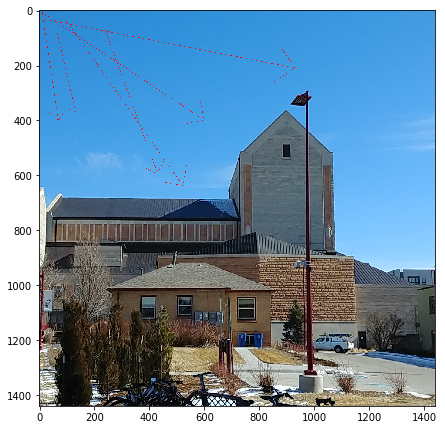

In [26]:
img_right = cv2.imread('./Img/Target_Img/mcr.jpg')
#pt1=([1,1,2,2,5,6,67,88,94,32,234,54,23,34])
pt1=((10,1),(2,2),(5,6),(67,88),(94,32),(234,54),(23,34))
pt2=((70,400),(600,400),(0,26),(134,376),(523,638),(431,595),(930,210))
#pt2=([7,4,6,4,0,2,1,3,5,63,41,55,93,21])
#pt1=np.reshape(pt1,(7,2))
#pt2=np.reshape(pt2,(7,2))
#pt1=(12,15)
#pt2=(200,300)
#img_right=cv2.arrowedLine(img_right, pt1, pt2, (0, 0, 255))
for i in range(7):
    img_right=cv2.arrowedLine(img_right, pt1[i], pt2[i], (0, 0, 255),1)
#cv2.imshow('img',img)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

plt.figure(figsize=(25,16))
plt.subplot(211),plt.imshow(BGR2RGB(img_right))


In [57]:
img_center = cv2.imread('./Img/Target_Img/mcc.jpg')
img_right = cv2.imread('./Img/Target_Img/mcr.jpg')
old_gray= cv2.cvtColor(img_center,cv2.COLOR_BGR2GRAY)
new_gray= cv2.cvtColor(img_right,cv2.COLOR_BGR2GRAY)
M,N = np.shape(old_gray)
tran_img = cv2.cornerHarris(np.float32(old_gray),2,3,0.04)
p_location = np.where(tran_img>0.05*tran_img.max())
#print(p_location)
rrow = np.shape(p_location)[1]
kp_old = np.zeros([rrow,2])
for i in range(rrow):
        kp_old[i,] = (p_location[1][i],p_location[0][i])
        
x = int(kp_old[1,0])
y = int(kp_old[1,1])
        #x = int(p_location[0][i])
        #y = int(p_location[1][i])
if (x-1>=0&x+2<=M&y-1>=0&y+2<=N):
    mat_9 = old_gray[x-1:x+3,x-1:x+3]
    print(mat_9,x,y,M,N)
    MAT_9 = new_gray[x-1:x+3,x-1:x+3]
    I_x=[[mat_9[j+1,g]-mat_9[j,g] for g in range(3)] for j in range(3)] 
    I_y=[[mat_9[j,g+1]-mat_9[j,g] for g in range(3)] for j in range(3)] 
    I_x=np.reshape(I_x,(1,9))
    I_y=np.reshape(I_y,(1,9))
    I_x2=np.sum(np.power(I_x,2))
    I_y2=np.sum(np.power(I_y,2))
    I_xy=np.dot(I_x,np.transpose(I_y))
#I_xy=np.dot(I_x,I_y)
    I_t=[[MAT_9[j,g]-mat_9[j,g] for g in range(3)] for j in range(3)] 
    I_t=np.reshape(I_t,(9,1))
    I_xt=np.dot(I_x,I_t)
    I_yt=np.dot(I_y,I_t)
    B=(int(-I_xt),int(-I_yt))
    A=((I_x2, int(I_xy)), (int(I_xy), I_y2))
    print(A)
    print(B)
#u,v=solve(A,B)
    u,v=np.linalg.solve(A,B)
    print(u,v)


[[ 95 147 182 187]
 [168 206 227 240]
 [184 212 233 250]
 [178 202 224 237]] 1337 649 1440 1440
((884, 223), (223, 1122))
(114, 212)
0.08558579117924593 0.17193793989931208


/Users/sunjian/anaconda3/envs/tfw/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: overflow encountered in ubyte_scalars
/Users/sunjian/anaconda3/envs/tfw/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: overflow encountered in ubyte_scalars


In [34]:
import numpy as np
pt2=((7,4),(6,4),(0,2),(1,3),(5,63),(41,55),(93,21))
#pt2=np.reshape(pt2,(7,2))
pt2[1]
pt3=(0,0)
pt3=np.append(pt3,(1,1))
pt3

array([0, 0, 1, 1])

## Extract Feature Points by SIFT

True

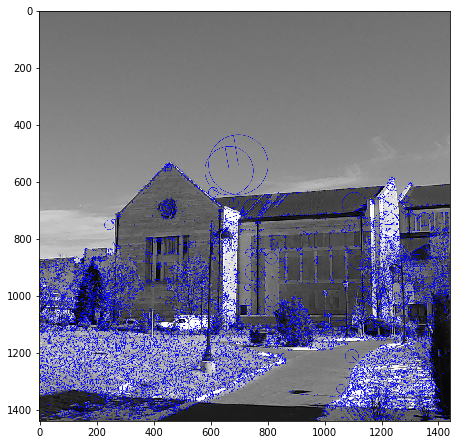

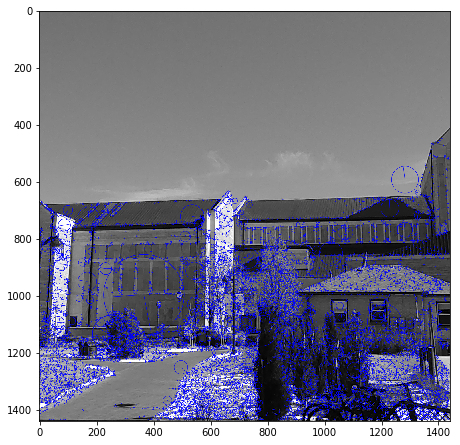

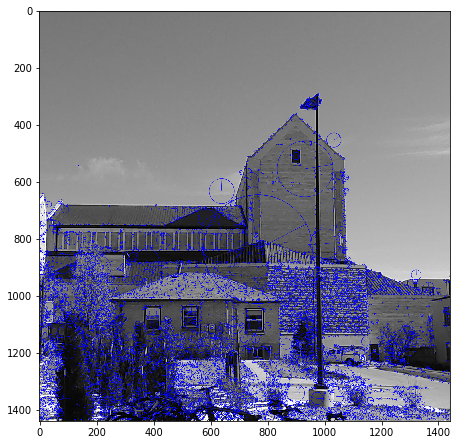

In [4]:
sift = cv2.xfeatures2d.SIFT_create()

kp_l, des_l = sift.detectAndCompute(gray_left,None)
kp_c, des_c = sift.detectAndCompute(gray_center,None)
kp_r, des_r = sift.detectAndCompute(gray_right,None)

imgl=cv2.drawKeypoints(gray_left,  kp_l,np.array([]), (255,0,0),cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
imgc=cv2.drawKeypoints(gray_center,kp_c,np.array([]), (255,0,0),cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
imgr=cv2.drawKeypoints(gray_right, kp_r,np.array([]), (255,0,0),cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(25,16))
plt.subplot(131),plt.imshow(BGR2RGB(imgl))
plt.figure(figsize=(25,16))
plt.subplot(132),plt.imshow(BGR2RGB(imgc))
plt.figure(figsize=(25,16))
plt.subplot(133),plt.imshow(BGR2RGB(imgr))

cv2.imwrite('kp_py_l.jpg',imgl)
cv2.imwrite('kp_py_c.jpg',imgc)
cv2.imwrite('kp_py_r.jpg',imgr)

## Use BFMatcher to Match SIFT Points

In [5]:
bf_rc = cv2.BFMatcher()
match_rc = bf_rc.knnMatch(des_r, des_c, k=2)

# Apply ratio test
good_rc = []

for m in match_rc:
    if m[0].distance < 0.7*m[1].distance:
        good_rc.append(m)

## Use RANSAC to find inliners and Parameters

In [6]:
match_rc = np.asarray(good_rc)
if len(match_rc[:,0]) >= 4:
    src_r = np.float32([ kp_r[m.queryIdx].pt for m in match_rc[:,0] ]).reshape(-1,1,2)
    src_c = np.float32([ kp_c[m.trainIdx].pt for m in match_rc[:,0] ]).reshape(-1,1,2)
    H_rc, mask_rc = cv2.findHomography(src_r,src_c, cv2.RANSAC, 5.0)
    Mask_rc = mask_rc.ravel().tolist()
    
    h,w,layer = np.shape(img_right)
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    mat_l = cv2.perspectiveTransform(pts,H_rc)
    
else:
    raise AssertionError('Can’t find enough keypoints.')
    Mask_rc = None

## Plot the inliers and Matching Key Points 

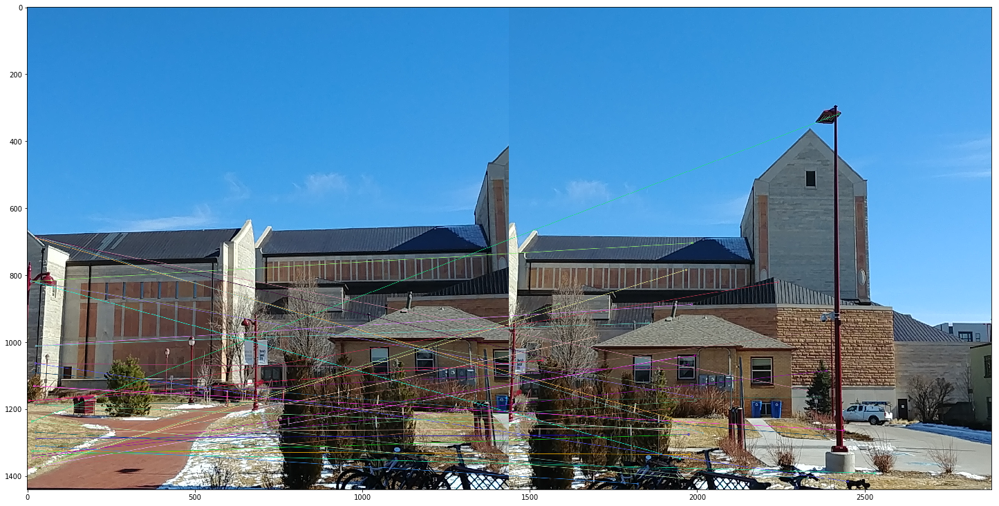

True

In [8]:
inliers = cv2.drawMatchesKnn(img_center,kp_c,img_right,kp_r,match_rc[:20],None,flags=2)
plt.figure(figsize=(25,16))
plt.imshow(BGR2RGB(inliers)),plt.show()
cv2.imwrite('mat_py_rc.jpg',inliers)

## Barkward Projection and Blend Images Together

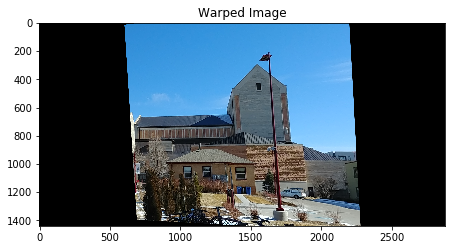

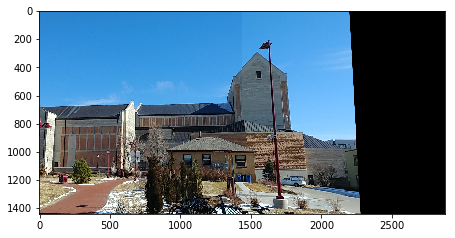

In [7]:
src_c = cv2.warpPerspective(img_right,H_rc,(img_center.shape[1]+img_right.shape[1], img_center.shape[0]))
plt.figure(figsize=(16,9))
plt.subplot(121),plt.imshow(BGR2RGB(src_c)),plt.title('Warped Image')
src_c[0:img_center.shape[0], 0:img_center.shape[1]] = img_center
cv2.imwrite('fuse_py_rc.jpg', src_c)
plt.figure(figsize=(16,9))
plt.subplot(122),plt.imshow(BGR2RGB(src_c))
plt.show()

## Add the third image

True

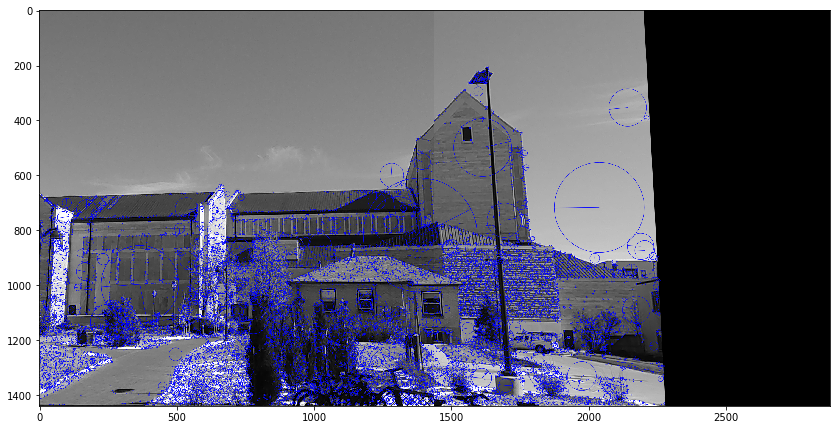

In [9]:
gray_rc= cv2.cvtColor(src_c,cv2.COLOR_BGR2GRAY)
kp_cl, des_cl = sift.detectAndCompute(gray_rc,None)
imgcl=cv2.drawKeypoints(gray_rc, kp_cl, np.array([]), (255,0,0),cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(25,16))
plt.subplot(211),plt.imshow(BGR2RGB(imgcl))

cv2.imwrite('kp_py_cl.jpg',imgl)


## Use BFMatcher to Match SIFT Points

In [10]:
bf_cl = cv2.BFMatcher()
match_cl = bf_cl.knnMatch(des_cl, des_l, k=2)
# Apply ratio test
good_cl = []
for m in match_cl:
    if m[0].distance < 0.5*m[1].distance:
        good_cl.append(m)

## Use RANSAC to find inliners and Parameters

In [11]:
match_cl = np.asarray(good_cl)
if len(match_cl[:,0]) >= 4:
    src_cl = np.float32([ kp_cl[m.queryIdx].pt for m in match_cl[:,0] ]).reshape(-1,1,2)
    src_l = np.float32([ kp_l[m.trainIdx].pt for m in match_cl[:,0] ]).reshape(-1,1,2)
    H_cl, mask_cl = cv2.findHomography(src_cl, src_l, cv2.RANSAC, 5.0)
    Mask_cl = mask_cl.ravel().tolist()
    
    h,w,layer = np.shape(src_c)
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    mat_l = cv2.perspectiveTransform(pts,H_cl)
    
    # add a line, can ignore this sentence #
    #img_cp = cv2.polylines(img_left,[np.int32(mat_l)],True,255,3, cv2.LINE_AA)
else:
    raise AssertionError('Can’t find enough keypoints.')
    Mask_rc = None

## Plot the inliers and Matching Key Points 

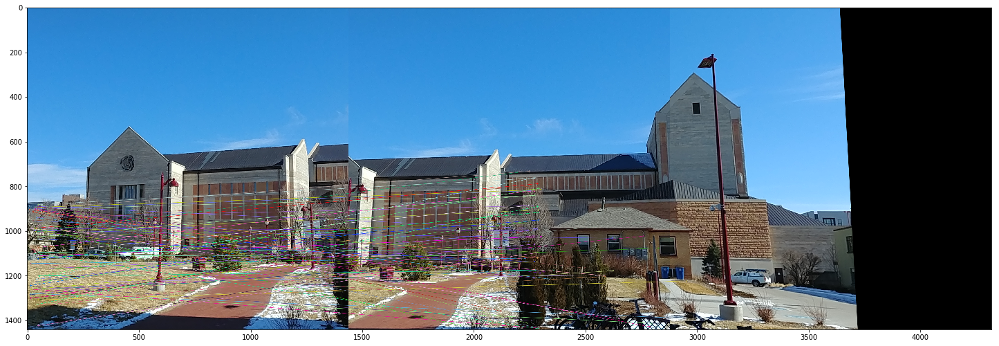

True

In [12]:
inliers = cv2.drawMatchesKnn(img_left,kp_l,src_c,kp_cl,good_cl[:40],None,flags=2)
plt.figure(figsize=(25,16))
plt.imshow(BGR2RGB(inliers)),plt.show()
cv2.imwrite('mat_py_cl.jpg',inliers)

## Barkward Projection and Blend Images Together

(<matplotlib.axes._subplots.AxesSubplot at 0x11231e668>,
 <matplotlib.image.AxesImage at 0x11236bb00>)

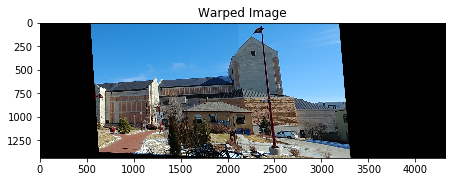

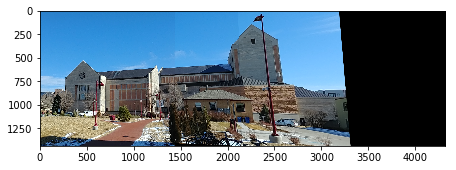

In [13]:
src_l = cv2.warpPerspective(src_c,H_cl,(img_left.shape[1] + src_c.shape[1], img_left.shape[0]))
plt.figure(figsize=(16,9))
plt.subplot(121),plt.imshow(BGR2RGB(src_l)),plt.title('Warped Image')

src_l[0:img_left.shape[0], 0:img_left.shape[1]] = img_left
cv2.imwrite('fuse_py_cl.jpg', src_l)
plt.figure(figsize=(16,9))
plt.subplot(122),plt.imshow(BGR2RGB(src_l))